# Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')
import os
import sys
import numpy as np
import pandas as pd
from tqdm import tqdm
pd.set_option("display.max_colwidth", -1)
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns
from tqdm import tqdm

from tensorflow.keras import layers
from tensorflow.keras.layers import Input,Conv2D,MaxPool2D,Dropout,Concatenate, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import datetime
from PIL import Image, ImageStat
import math

%load_ext tensorboard

In [2]:
#seeding
seed = 2021
np.random.seed = seed
tf.seed = seed

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"maksahu","key":"cff8c0f086aa6e0e50553f7ab0580687"}'}

In [4]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Data

In [5]:
!kaggle competitions download -c data-science-bowl-2018

  0% 0.00/386k [00:00<?, ?B/s]
100% 386k/386k [00:00<00:00, 57.4MB/s]
  0% 0.00/9.10M [00:00<?, ?B/s]
100% 9.10M/9.10M [00:00<00:00, 83.7MB/s]
100% 79.0M/79.1M [00:00<00:00, 116MB/s] 
100% 79.1M/79.1M [00:00<00:00, 156MB/s]
  0% 0.00/2.67M [00:00<?, ?B/s]
100% 2.67M/2.67M [00:00<00:00, 88.7MB/s]
 95% 263M/276M [00:02<00:00, 131MB/s]
100% 276M/276M [00:02<00:00, 115MB/s]
  0% 0.00/112k [00:00<?, ?B/s]
100% 112k/112k [00:00<00:00, 33.9MB/s]
  0% 0.00/2.62k [00:00<?, ?B/s]
100% 2.62k/2.62k [00:00<00:00, 2.71MB/s]


In [6]:
#Creating these two folder
!mkdir train test

In [7]:
#Unziping the training and testing folders into directories
print('Unzipping stage1_train.zip')
!unzip -q "/content/stage1_train.zip" -d train/
print('Unzipped stage1_train.zip')

print('Unzipping stage1_test.zip')
!unzip -q "/content/stage1_train.zip" -d test/
print('Unzipped stage1_test.zip')

Unzipping stage1_train.zip
Unzipped stage1_train.zip
Unzipping stage1_test.zip
Unzipped stage1_test.zip


In [8]:
# Root directories for training and testing
TRAIN_ROOT = './train'
TEST_ROOT = './test'

In [9]:
# Function to create a dataframe of files which will be used for further processing
def files_df(root_dir):
    subdir = os.listdir(root_dir)
    files = []
    df = pd.DataFrame()
    for dir in subdir:
        files.append(os.path.join(root_dir,dir))
    df['files'] = files
    return df

In [10]:
train_df = files_df(TRAIN_ROOT)
test_df = files_df(TEST_ROOT)

In [11]:
# Hyperparameters
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_CHANNELS = 3
CLASSES = 1
BATCH_SIZE = 8

In [12]:
# Function which will create a dataframe of image paths and mask paths along with creating a single mask with multiple masks
def image_df(filenames):
    image_paths = []
    mask_paths = []
    df = pd.DataFrame()
    for filename in tqdm(filenames):
        file_path = os.path.join(filename,'images')
        image_path = os.path.join(file_path,os.listdir(file_path)[0])
        image_paths.append(image_path)
        
        mask = np.zeros((IMG_WIDTH,IMG_HEIGHT,CLASSES))
        mask_dir = file_path.replace("images", "masks")
        masks = os.listdir(mask_dir)
        for m in masks:
            mask_path = os.path.join(mask_dir,m)
            mask_  = cv2.imread(mask_path, cv2.IMREAD_UNCHANGED)
            mask_  = cv2.resize(mask_,(IMG_WIDTH,IMG_HEIGHT),interpolation=cv2.INTER_NEAREST)
            mask_  = np.expand_dims(mask_, axis = -1)
            mask = np.maximum(mask,mask_)
        newmask_dir = mask_dir.replace("masks", "masks_")
        if not os.path.isdir(newmask_dir):
            os.mkdir(newmask_dir)
        newmask_path = image_path.replace("images", "masks_")
        mask_paths.append(newmask_path)
        cv2.imwrite(newmask_path, mask)
    df['images'] = image_paths
    df['masks'] = mask_paths
    return df

In [13]:
# Training dataframe
train_filenames = train_df['files']
train = image_df(train_filenames)

100%|██████████| 670/670 [00:30<00:00, 22.16it/s]


In [14]:
train.head()

,images,masks
0,./train/8b12e18670e4b24d03567d1e17c0c24fadf0ea2c1e763983dd6bb4c44b7376a6/images/8b12e18670e4b24d03567d1e17c0c24fadf0ea2c1e763983dd6bb4c44b7376a6.png,./train/8b12e18670e4b24d03567d1e17c0c24fadf0ea2c1e763983dd6bb4c44b7376a6/masks_/8b12e18670e4b24d03567d1e17c0c24fadf0ea2c1e763983dd6bb4c44b7376a6.png
1,./train/40bcdad218ac5f0885fc247d88fcad9f729f55c81c79d241a8f1559b6d8c0574/images/40bcdad218ac5f0885fc247d88fcad9f729f55c81c79d241a8f1559b6d8c0574.png,./train/40bcdad218ac5f0885fc247d88fcad9f729f55c81c79d241a8f1559b6d8c0574/masks_/40bcdad218ac5f0885fc247d88fcad9f729f55c81c79d241a8f1559b6d8c0574.png
2,./train/cc88627344305b9a9b07f8bd042cb074c7a834c13de67ff4b24914ac68f07f6e/images/cc88627344305b9a9b07f8bd042cb074c7a834c13de67ff4b24914ac68f07f6e.png,./train/cc88627344305b9a9b07f8bd042cb074c7a834c13de67ff4b24914ac68f07f6e/masks_/cc88627344305b9a9b07f8bd042cb074c7a834c13de67ff4b24914ac68f07f6e.png
3,./train/bc115ff727e997a88f7cfe4ce817745731a6c753cb9fab6a36e7e66b415a1d3d/images/bc115ff727e997a88f7cfe4ce817745731a6c753cb9fab6a36e7e66b415a1d3d.png,./train/bc115ff727e997a88f7cfe4ce817745731a6c753cb9fab6a36e7e66b415a1d3d/masks_/bc115ff727e997a88f7cfe4ce817745731a6c753cb9fab6a36e7e66b415a1d3d.png
4,./train/df53d0b6c2c4e45d759b2c474011e2b2b32552cd100ca4b22388ab9ca1750ee2/images/df53d0b6c2c4e45d759b2c474011e2b2b32552cd100ca4b22388ab9ca1750ee2.png,./train/df53d0b6c2c4e45d759b2c474011e2b2b32552cd100ca4b22388ab9ca1750ee2/masks_/df53d0b6c2c4e45d759b2c474011e2b2b32552cd100ca4b22388ab9ca1750ee2.png


# Train Test Split

In [15]:
X_train, X_val = train_test_split(train, test_size=0.1, random_state=42)

In [16]:
X_train.head()

,images,masks
300,./train/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f/images/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f.png,./train/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f/masks_/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f.png
60,./train/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895/images/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895.png,./train/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895/masks_/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895.png
133,./train/9fb32aba1c2fd53273dca9abefac944ba747f578da82dfaa1249f332a2324944/images/9fb32aba1c2fd53273dca9abefac944ba747f578da82dfaa1249f332a2324944.png,./train/9fb32aba1c2fd53273dca9abefac944ba747f578da82dfaa1249f332a2324944/masks_/9fb32aba1c2fd53273dca9abefac944ba747f578da82dfaa1249f332a2324944.png
30,./train/220b37f4ca7cab486d2b71cd87a46ee7411a5aa142799d96ed98015ab5ba538a/images/220b37f4ca7cab486d2b71cd87a46ee7411a5aa142799d96ed98015ab5ba538a.png,./train/220b37f4ca7cab486d2b71cd87a46ee7411a5aa142799d96ed98015ab5ba538a/masks_/220b37f4ca7cab486d2b71cd87a46ee7411a5aa142799d96ed98015ab5ba538a.png
69,./train/4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0/images/4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0.png,./train/4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0/masks_/4596961c789d3b41916492918797724fe75128239fefc516c3ee75322b7926f0.png


In [17]:
X_val.head()

,images,masks
361,./train/f8e74d4006dd68c1dbe68df7be905835e00d8ba4916f3b18884509a15fdc0b55/images/f8e74d4006dd68c1dbe68df7be905835e00d8ba4916f3b18884509a15fdc0b55.png,./train/f8e74d4006dd68c1dbe68df7be905835e00d8ba4916f3b18884509a15fdc0b55/masks_/f8e74d4006dd68c1dbe68df7be905835e00d8ba4916f3b18884509a15fdc0b55.png
158,./train/5d2c98fd6fda3c7d739461c3b3d4a0c7f8456121a14519dc5955a1775227b053/images/5d2c98fd6fda3c7d739461c3b3d4a0c7f8456121a14519dc5955a1775227b053.png,./train/5d2c98fd6fda3c7d739461c3b3d4a0c7f8456121a14519dc5955a1775227b053/masks_/5d2c98fd6fda3c7d739461c3b3d4a0c7f8456121a14519dc5955a1775227b053.png
480,./train/f01a9742c43a69f087700a43893f713878e537bae8e44f76b957f09519601ad6/images/f01a9742c43a69f087700a43893f713878e537bae8e44f76b957f09519601ad6.png,./train/f01a9742c43a69f087700a43893f713878e537bae8e44f76b957f09519601ad6/masks_/f01a9742c43a69f087700a43893f713878e537bae8e44f76b957f09519601ad6.png
640,./train/9620c33d8ef2772dbc5bd152429f507bd7fafb27e12109003292b671e556b089/images/9620c33d8ef2772dbc5bd152429f507bd7fafb27e12109003292b671e556b089.png,./train/9620c33d8ef2772dbc5bd152429f507bd7fafb27e12109003292b671e556b089/masks_/9620c33d8ef2772dbc5bd152429f507bd7fafb27e12109003292b671e556b089.png
275,./train/237802ac5005f9cf782367156c46c383efd9e05088e5768ca883cbbe24abadb1/images/237802ac5005f9cf782367156c46c383efd9e05088e5768ca883cbbe24abadb1.png,./train/237802ac5005f9cf782367156c46c383efd9e05088e5768ca883cbbe24abadb1/masks_/237802ac5005f9cf782367156c46c383efd9e05088e5768ca883cbbe24abadb1.png


# Data Preprocessing

In [18]:
# Function to parse image and mask file path and convert them into image and mask
def parse_function(image_path, mask_path):
    image_string = tf.io.read_file(image_path)
    image = tf.image.decode_png(image_string, channels=IMG_CHANNELS)#
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH]) # height x width
    
    mask_string = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask_string, channels=CLASSES)#
    mask = tf.image.convert_image_dtype(mask, tf.float32)
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])                      
    return image, mask

In [19]:
# Training dataset
train_ds = tf.data.Dataset.from_tensor_slices((X_train['images'], X_train['masks']))
train_ds = train_ds.shuffle(X_train.shape[0])
train_ds = train_ds.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(1)

In [20]:
# Validation dataset
val_ds = tf.data.Dataset.from_tensor_slices((X_val['images'], X_val['masks']))
val_ds = val_ds.map(parse_function, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE)
val_ds = val_ds.prefetch(1)

# Sample of Train and Validation datasets

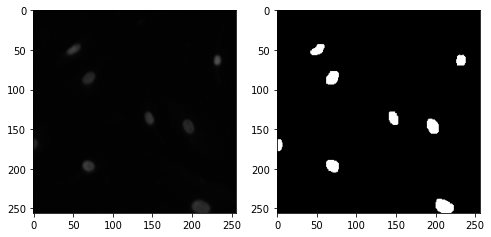

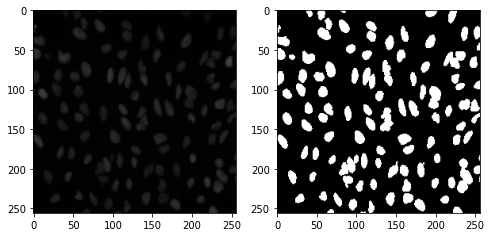

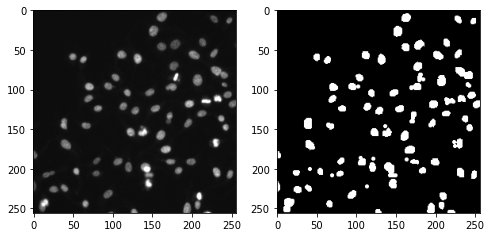

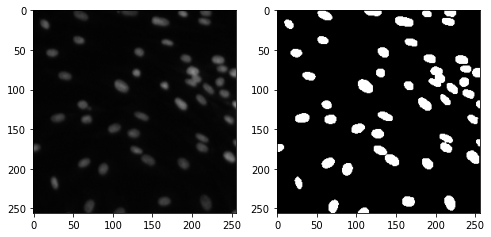

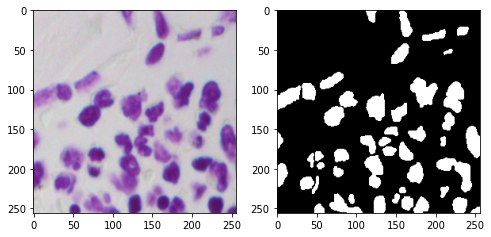

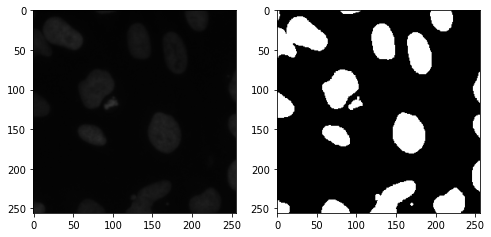

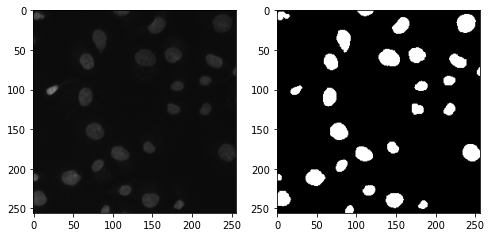

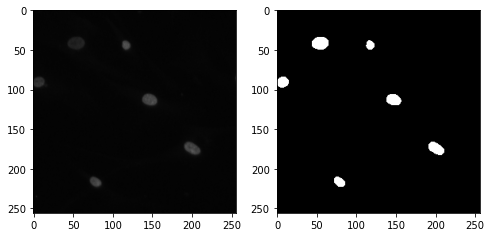

In [22]:
# Sample of training dataset
for image, mask in train_ds.take(1):
    for i in range(BATCH_SIZE):
        plt.figure(figsize=(8,4))
        plt.subplot(121)
        plt.imshow(image[i])
        plt.subplot(122)
        plt.imshow(mask[i][:,:,0], cmap = 'gray')
        plt.show()

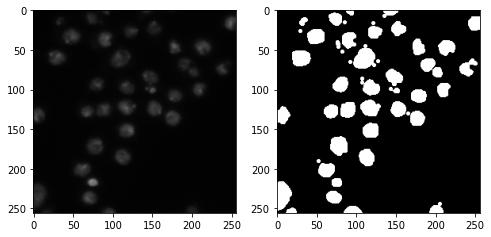

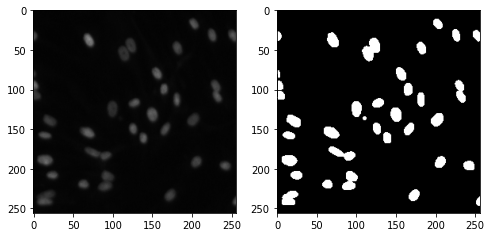

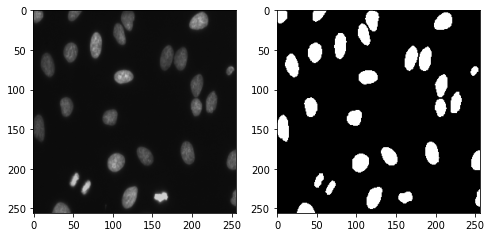

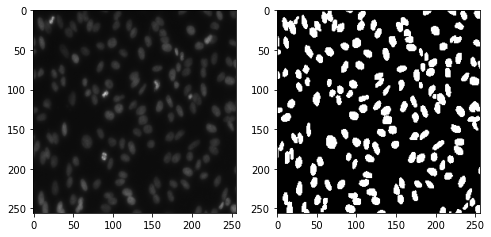

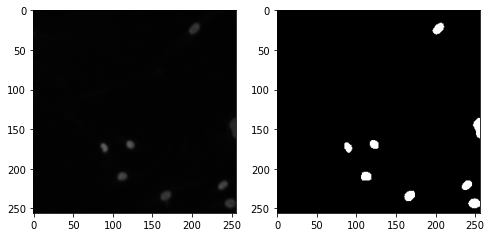

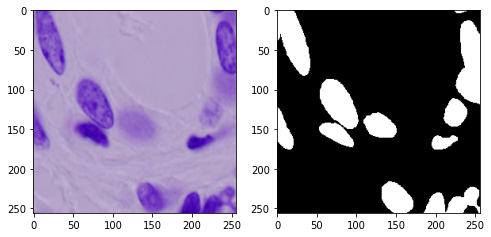

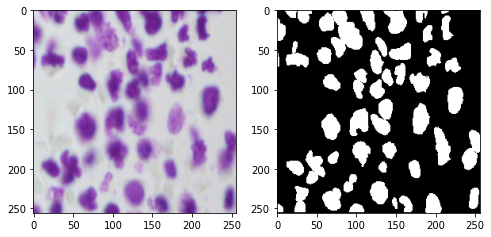

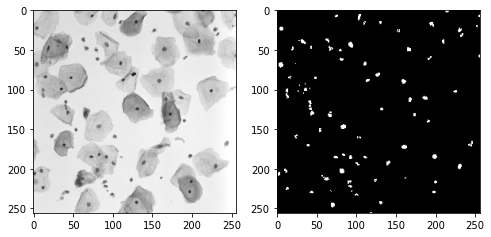

In [23]:
# Sample of validation dataset
for image, mask in val_ds.take(1):
    for i in range(BATCH_SIZE):
        plt.figure(figsize=(8,4))
        plt.subplot(121)
        plt.imshow(image[i])
        plt.subplot(122)
        plt.imshow(mask[i][:,:,0], cmap = 'gray')
        plt.show()

# Basic Model - Unet

## Performance Metric

In [24]:
# Custom MeanIoU Metric function
class MeanIoU(tf.keras.metrics.Metric):
    def __init__(self, num_classes, thres=0.5, name='mean_iou', dtype=None):
        super(MeanIoU, self).__init__(name=name, dtype=dtype)
        self.num_classes = num_classes
        self.thres = thres
        self.total_cm = self.add_weight('total_confusion_matrix',
                                        shape=(num_classes, num_classes),
                                        initializer=tf.zeros_initializer())

    def update_state(self, y_true, y_pred, sample_weight=None):
        
        y_true = tf.cast(y_true, self._dtype)
        y_pred = tf.cast(y_pred, self._dtype)
        if y_pred.shape.ndims > 1:
            y_pred = tf.reshape(y_pred, [-1])
        if y_true.shape.ndims > 1:
            y_true = tf.reshape(y_true, [-1])
        
        y_pred = tf.where(y_pred > self.thres, 1.0, 0.0)
        
        if sample_weight is not None:
            sample_weight = tf.cast(sample_weight, self._dtype)
            if sample_weight.shape.ndims > 1:
                sample_weight = tf.reshape(sample_weight, [-1])
        current_cm = tf.math.confusion_matrix(y_true,
                                              y_pred,
                                              self.num_classes,
                                              weights=sample_weight,
                                              dtype=self._dtype)
        
        return self.total_cm.assign_add(current_cm)

    def result(self):
        sum_over_row = tf.cast(tf.reduce_sum(self.total_cm, axis=0), dtype=self._dtype)
        sum_over_col = tf.cast(tf.reduce_sum(self.total_cm, axis=1), dtype=self._dtype)
        true_positives = tf.cast(tf.linalg.tensor_diag_part(self.total_cm), dtype=self._dtype)
        denominator = sum_over_row + sum_over_col - true_positives
        num_valid_entries = tf.reduce_sum(tf.cast(tf.math.not_equal(denominator, 0), dtype=self._dtype))
        iou = tf.math.divide_no_nan(true_positives, denominator)
        return tf.math.divide_no_nan(tf.reduce_sum(iou, name='mean_iou'), num_valid_entries)
    
    def reset_states(self):
        # The state of the metric will be reset at the start of each epoch.
        tf.keras.backend.set_value(self.total_cm, np.zeros((self.num_classes, self.num_classes)))
        
    def get_config(self):
        config = {'num_classes': self.num_classes}
        base_config = super(MeanIoU, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

## Architecture

In [25]:
mean_iou = MeanIoU(2, 0.4)

In [26]:
# Input Layer
# Input shape 256X256X3
inputs = Input((IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))

# Left Side/Downsampling Side
# 256 -> 128
conv1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
conv1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv1)
pool1 = MaxPool2D((2, 2))(conv1)
pool1 = Dropout(0.25)(pool1)

# 128 -> 64
conv2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool1)
conv2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv2)
pool2 = MaxPool2D((2, 2))(conv2)
pool2 = Dropout(0.5)(pool2)

# 64 -> 32
conv3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool2)
conv3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv3)
pool3 = MaxPool2D((2, 2))(conv3)
pool3 = Dropout(0.5)(pool3)

# 32 -> 16
conv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool3)
conv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(conv4)
pool4 = MaxPool2D((2, 2))(conv4)
pool4 = Dropout(0.5)(pool4)

# Middle Part
# 16 -> 16
convm = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(pool4)
convm = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(convm)

# Right Side/ Upsampling Side
# 16 -> 32
uconv4 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(convm)
uconv4 = Concatenate()([uconv4, conv4])
uconv4 = Dropout(0.5)(uconv4)
uconv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv4)
uconv4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv4)

# 32 -> 64
uconv3 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(uconv4)
uconv3 = Concatenate()([uconv3, conv3])
uconv3 = Dropout(0.5)(uconv3)
uconv3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv3)
uconv3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv3)

# 64 -> 128
uconv2 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(uconv3)
uconv2 = Concatenate()([uconv2, conv2])
uconv2 = Dropout(0.5)(uconv2)
uconv2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv2)
uconv2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv2)

# 128 -> 256
uconv1 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(uconv2)
uconv1 = Concatenate()([uconv1, conv1])
uconv1 = Dropout(0.5)(uconv1)
uconv1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv1)
uconv1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(uconv1)

# Output Layer
# Output shape 256X256X1
outputs = Conv2D(CLASSES, (1, 1), activation='sigmoid')(uconv1)

model = Model(inputs=[inputs], outputs=[outputs])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[mean_iou])#
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 128, 128, 16) 0           conv2d_1[0][0]                   
______________________________________________________________________________________________

## Callbacks

In [27]:
!rm -rf ./model_save/

In [28]:
# Modelcheckpoint callback
if not os.path.exists('model_save'):
    os.makedirs('model_save')
filepath="model_save/weights-{epoch:04d}.hdf5"
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=filepath,
                                       save_best_only=True,
                                       mode='auto', 
                                       monitor='val_loss')

In [29]:
!rm -rf ./model/ 

In [30]:
# Tensorboard Callback
log_dir = os.path.join("model", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir,
                                                      histogram_freq=1, 
                                                      write_graph=True)

## Training

In [31]:
callbacks_list = [checkpoint, tensorboard_callback]
history = model.fit(train_ds,
                    initial_epoch = 0,
                    epochs=30, 
                    callbacks=callbacks_list, 
                    validation_data=val_ds)

Epoch 1/30
76/76 [==============================] - 45s 137ms/step - loss: 0.3766 - mean_iou: 0.4305 - val_loss: 0.2563 - val_mean_iou: 0.5399
Epoch 2/30
76/76 [==============================] - 8s 98ms/step - loss: 0.1712 - mean_iou: 0.7676 - val_loss: 0.1942 - val_mean_iou: 0.7713
Epoch 3/30
76/76 [==============================] - 8s 98ms/step - loss: 0.1095 - mean_iou: 0.8448 - val_loss: 0.1644 - val_mean_iou: 0.7984
Epoch 4/30
76/76 [==============================] - 8s 100ms/step - loss: 0.1012 - mean_iou: 0.8538 - val_loss: 0.1279 - val_mean_iou: 0.8246
Epoch 5/30
76/76 [==============================] - 8s 100ms/step - loss: 0.0909 - mean_iou: 0.8651 - val_loss: 0.1218 - val_mean_iou: 0.8280
Epoch 6/30
76/76 [==============================] - 8s 100ms/step - loss: 0.0839 - mean_iou: 0.8738 - val_loss: 0.1145 - val_mean_iou: 0.8325
Epoch 7/30
76/76 [==============================] - 8s 101ms/step - loss: 0.0813 - mean_iou: 0.8792 - val_loss: 0.1105 - val_mean_iou: 0.8383
Epoch 8

In [32]:
initial_epoch = int(sorted(os.listdir('model_save'))[-1].split('.')[0].split('-')[-1])
history = model.fit(train_ds, 
                    initial_epoch = initial_epoch,
                    epochs=60, 
                    callbacks=callbacks_list, 
                    validation_data=val_ds)

Epoch 27/60
76/76 [==============================] - 9s 113ms/step - loss: 0.0645 - mean_iou: 0.8981 - val_loss: 0.0739 - val_mean_iou: 0.8980
Epoch 28/60
76/76 [==============================] - 8s 103ms/step - loss: 0.0635 - mean_iou: 0.8992 - val_loss: 0.0714 - val_mean_iou: 0.8986
Epoch 29/60
76/76 [==============================] - 8s 102ms/step - loss: 0.0649 - mean_iou: 0.8973 - val_loss: 0.0962 - val_mean_iou: 0.8600
Epoch 30/60
76/76 [==============================] - 8s 108ms/step - loss: 0.0659 - mean_iou: 0.8955 - val_loss: 0.0762 - val_mean_iou: 0.8937
Epoch 31/60
76/76 [==============================] - 9s 119ms/step - loss: 0.0647 - mean_iou: 0.8977 - val_loss: 0.0812 - val_mean_iou: 0.8880
Epoch 32/60
76/76 [==============================] - 9s 117ms/step - loss: 0.0636 - mean_iou: 0.8993 - val_loss: 0.0741 - val_mean_iou: 0.8937
Epoch 33/60
76/76 [==============================] - 9s 114ms/step - loss: 0.0623 - mean_iou: 0.9008 - val_loss: 0.0813 - val_mean_iou: 0.8900

## Tensorboard

In [33]:
%tensorboard --logdir model1

<IPython.core.display.Javascript object>

## Inference

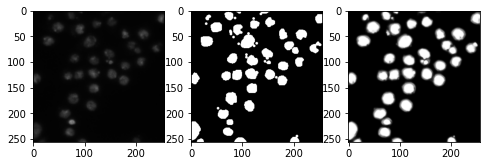

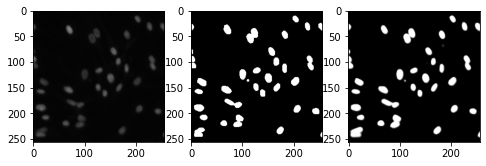

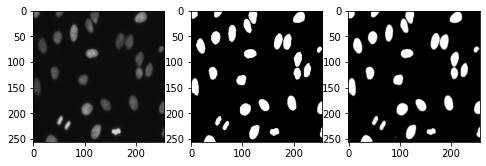

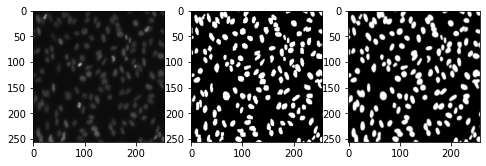

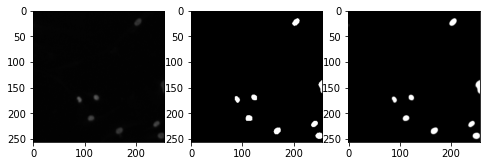

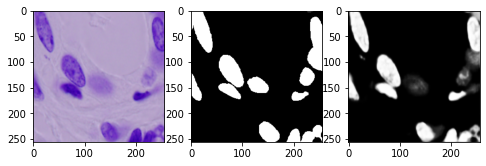

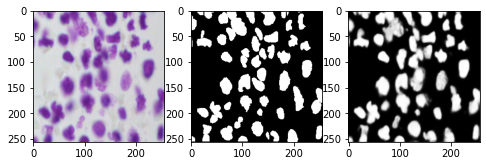

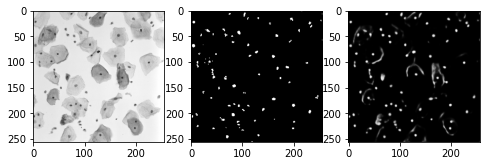

In [34]:
for image, mask in val_ds.take(1):
    for i in range(BATCH_SIZE):
        plt.figure(figsize=(8,4))
        plt.subplot(131)
        plt.imshow(image[i])
        plt.subplot(132)
        plt.imshow(mask[i][:,:,0], cmap = 'gray')
        
        pred_mask  = model.predict(image[i][np.newaxis,:,:,:])
        plt.subplot(133)
        plt.imshow(pred_mask[0,:,:,0], cmap = 'gray')
        plt.show()

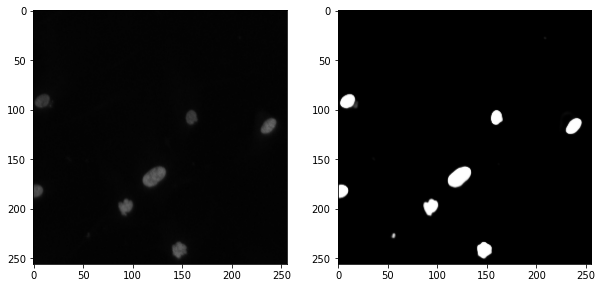

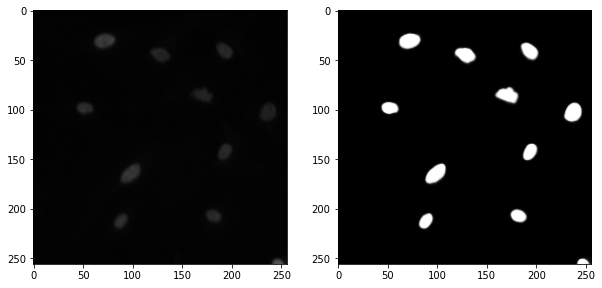

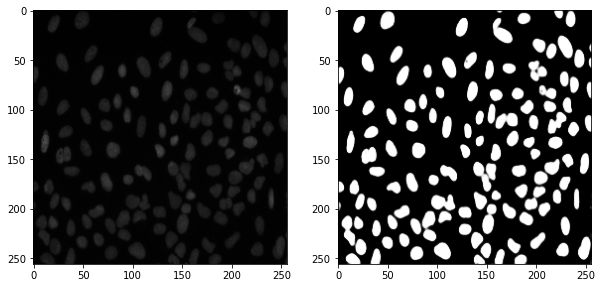

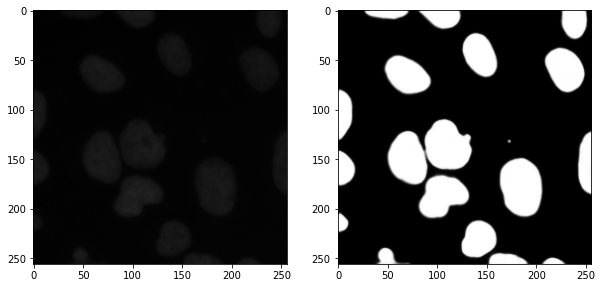

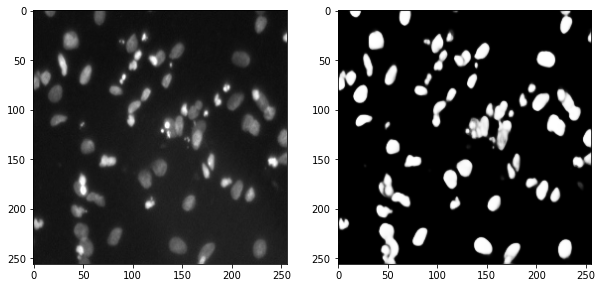

In [35]:
test_filenames = test_df['files']
for filename in test_filenames[:5]:
    file_path = os.path.join(filename,'images')
    image_path = os.path.join(file_path,os.listdir(file_path)[0])
    image_string = tf.io.read_file(image_path)
    image = tf.image.decode_png(image_string, channels=IMG_CHANNELS)#
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH]) # height x width
    
    pred_mask  = model.predict(image[np.newaxis,:,:,:])
    
    plt.figure(figsize=(10,6))
    plt.subplot(121)
    plt.imshow(image)
    plt.subplot(122)
    plt.imshow(pred_mask[0,:,:,0], cmap='gray')
    plt.show()

# EDA

In [36]:
# Function to create a dataframe with iou_scores and image and mask paths.
def metric_df(data):
    iou_scores = []
    m = MeanIoU(2, 0.4)
    for i in range(len(data)):
        image_path = data['images'].iloc[i]
        mask_path = data['masks'].iloc[i]
        image_string = tf.io.read_file(image_path)
        image = tf.image.decode_png(image_string, channels=IMG_CHANNELS)#
        image = tf.image.convert_image_dtype(image, tf.float32)
        image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH]) # height x width
    
        mask_string = tf.io.read_file(mask_path)
        mask = tf.image.decode_png(mask_string, channels=CLASSES)#
        mask = tf.image.convert_image_dtype(mask, tf.float32)
        mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])
        
        pred_mask = model.predict(image[np.newaxis,:,:,:])
        m.update_state(mask, pred_mask)
        iou_score = m.result().numpy()
        iou_scores.append(iou_score)
    data['iou_scores'] = iou_scores
    return data

In [37]:
df = X_train.copy()
df = metric_df(df)
df = df.sort_values('iou_scores')
df.head()

,images,masks,iou_scores
148,./train/f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8bc639d4121c1672ff7/images/f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8bc639d4121c1672ff7.png,./train/f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8bc639d4121c1672ff7/masks_/f487cc82271cf84b4414552aa8b0a9d82d902451ebe8e8bc639d4121c1672ff7.png,0.896168
65,./train/adc315bd40d699fd4e4effbcce81cd7162851007f485d754ad3b0472f73a86df/images/adc315bd40d699fd4e4effbcce81cd7162851007f485d754ad3b0472f73a86df.png,./train/adc315bd40d699fd4e4effbcce81cd7162851007f485d754ad3b0472f73a86df/masks_/adc315bd40d699fd4e4effbcce81cd7162851007f485d754ad3b0472f73a86df.png,0.897015
617,./train/a7f767ca9770b160f234780e172aeb35a50830ba10dc49c526f4712451abe1d2/images/a7f767ca9770b160f234780e172aeb35a50830ba10dc49c526f4712451abe1d2.png,./train/a7f767ca9770b160f234780e172aeb35a50830ba10dc49c526f4712451abe1d2/masks_/a7f767ca9770b160f234780e172aeb35a50830ba10dc49c526f4712451abe1d2.png,0.898796
49,./train/10328b822b836e67b547b4144e0b7eb43747c114ce4cacd8b540648892945b00/images/10328b822b836e67b547b4144e0b7eb43747c114ce4cacd8b540648892945b00.png,./train/10328b822b836e67b547b4144e0b7eb43747c114ce4cacd8b540648892945b00/masks_/10328b822b836e67b547b4144e0b7eb43747c114ce4cacd8b540648892945b00.png,0.900391
306,./train/a31deaf0ac279d5f34fb2eca80cc2abce6ef30bd64e7aca40efe4b2ba8e9ad3d/images/a31deaf0ac279d5f34fb2eca80cc2abce6ef30bd64e7aca40efe4b2ba8e9ad3d.png,./train/a31deaf0ac279d5f34fb2eca80cc2abce6ef30bd64e7aca40efe4b2ba8e9ad3d/masks_/a31deaf0ac279d5f34fb2eca80cc2abce6ef30bd64e7aca40efe4b2ba8e9ad3d.png,0.900582


In [38]:
df.tail()

,images,masks,iou_scores
338,./train/b0d6dfcc95e4d087d232378f860fc3ef9f95ea5a4c26d623a0be091f820a793f/images/b0d6dfcc95e4d087d232378f860fc3ef9f95ea5a4c26d623a0be091f820a793f.png,./train/b0d6dfcc95e4d087d232378f860fc3ef9f95ea5a4c26d623a0be091f820a793f/masks_/b0d6dfcc95e4d087d232378f860fc3ef9f95ea5a4c26d623a0be091f820a793f.png,0.926667
44,./train/f35ab34528e3e2d2589d24cbffc0e10024dfc474a68585d0b5feb7b05aa0067f/images/f35ab34528e3e2d2589d24cbffc0e10024dfc474a68585d0b5feb7b05aa0067f.png,./train/f35ab34528e3e2d2589d24cbffc0e10024dfc474a68585d0b5feb7b05aa0067f/masks_/f35ab34528e3e2d2589d24cbffc0e10024dfc474a68585d0b5feb7b05aa0067f.png,0.928195
182,./train/d751ccb64fa767a65a966061218438bd1860695d96bbef11fdb2f0d3b8dedba8/images/d751ccb64fa767a65a966061218438bd1860695d96bbef11fdb2f0d3b8dedba8.png,./train/d751ccb64fa767a65a966061218438bd1860695d96bbef11fdb2f0d3b8dedba8/masks_/d751ccb64fa767a65a966061218438bd1860695d96bbef11fdb2f0d3b8dedba8.png,0.930094
60,./train/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895/images/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895.png,./train/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895/masks_/b61d3fb0d0ebbee018346e0adeff9e9178f33aa95262779b3c196f93b4ace895.png,0.938454
300,./train/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f/images/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f.png,./train/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f/masks_/ac8169a0debed11560f3f0e246c05ea82d03c66346f1576cc8268554cb3f549f.png,0.947107


## Best Output samples

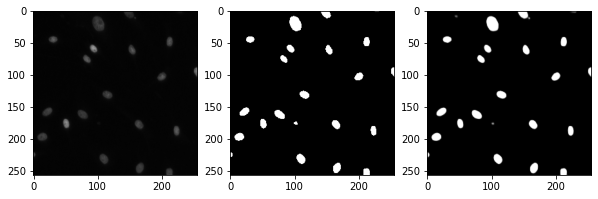

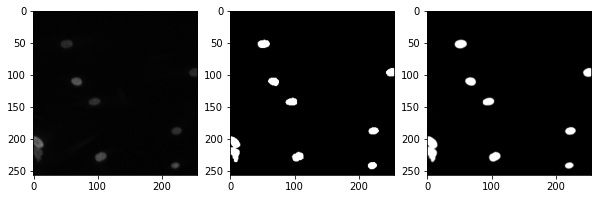

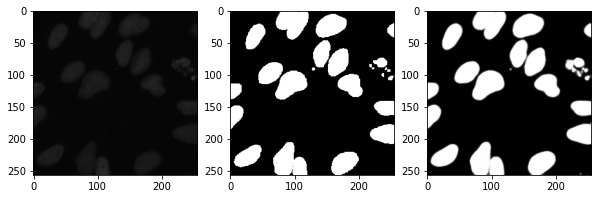

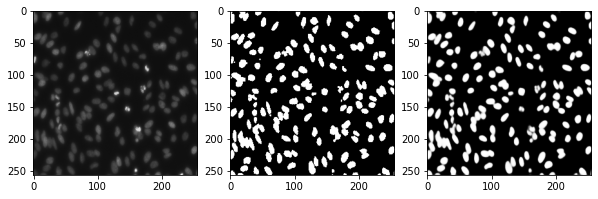

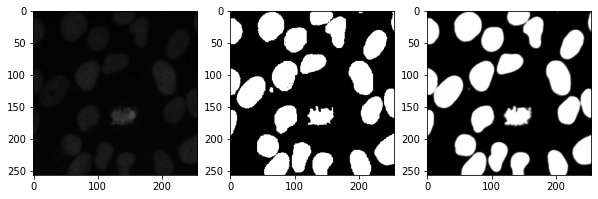

In [39]:
d1 = df.tail()
for i in range(5):
    image_path = d1['images'].iloc[i]
    mask_path = d1['masks'].iloc[i]
    image_string = tf.io.read_file(image_path)
    image = tf.image.decode_png(image_string, channels=IMG_CHANNELS)#
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH]) # height x width
    
    mask_string = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask_string, channels=CLASSES)#
    mask = tf.image.convert_image_dtype(mask, tf.float32)
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])
    
    pred_mask  = model.predict(image[np.newaxis,:,:,:])
    
    plt.figure(figsize=(10,6))
    plt.subplot(131)
    plt.imshow(image)
    plt.subplot(132)
    plt.imshow(mask[:,:,0], cmap='gray')
    plt.subplot(133)
    plt.imshow(pred_mask[0,:,:,0], cmap='gray')

## Worst Output Samples

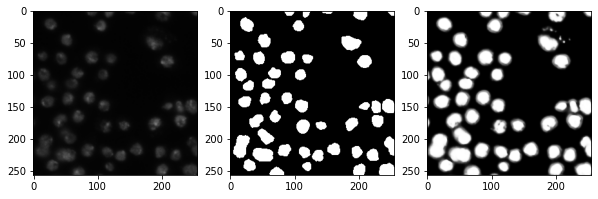

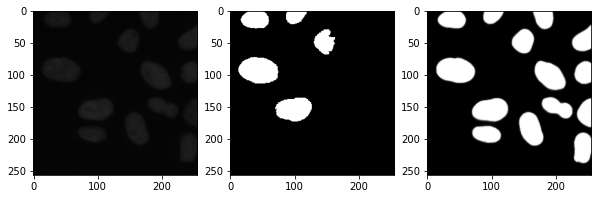

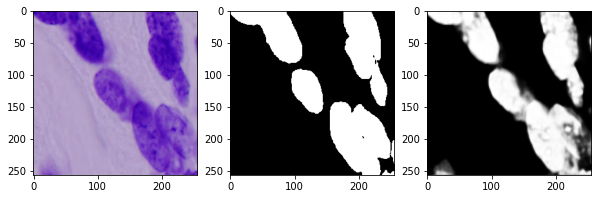

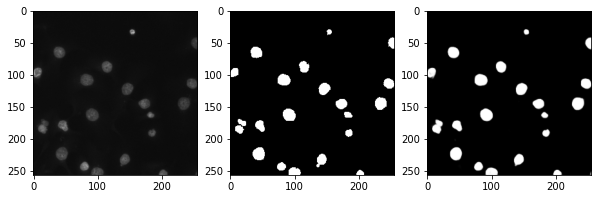

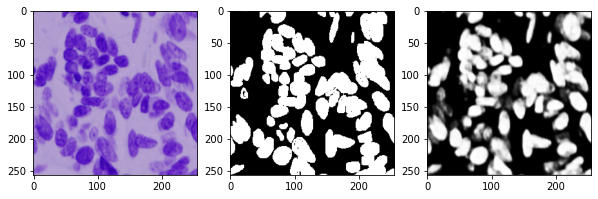

In [40]:
d2 = df.head()
for i in range(5):
    image_path = d2['images'].iloc[i]
    mask_path = d2['masks'].iloc[i]
    image_string = tf.io.read_file(image_path)
    image = tf.image.decode_png(image_string, channels=IMG_CHANNELS)#
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH]) # height x width
    
    mask_string = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask_string, channels=CLASSES)#
    mask = tf.image.convert_image_dtype(mask, tf.float32)
    mask = tf.image.resize(mask, [IMG_HEIGHT, IMG_WIDTH])
    
    pred_mask  = model.predict(image[np.newaxis,:,:,:])
    
    plt.figure(figsize=(10,6))
    plt.subplot(131)
    plt.imshow(image)
    plt.subplot(132)
    plt.imshow(mask[:,:,0], cmap='gray')
    plt.subplot(133)
    plt.imshow(pred_mask[0,:,:,0], cmap='gray')
    plt.show()

## Distribution of 'iou_scores'

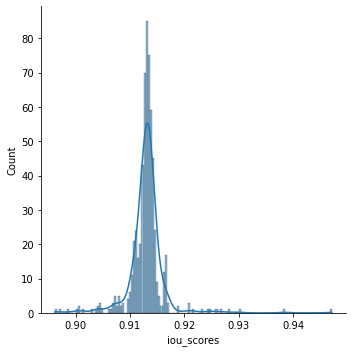

In [41]:
sns.displot(data=df, x="iou_scores", kde=True)